In [1]:
%matplotlib inline
import matplotlib.pyplot as plt

import cv2
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet import preprocess_input

from skimage import img_as_float
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import mean_squared_error as mse

In [2]:
def resize_image(img, min_side=1000, max_side=1400):
    """!@brief
    Resize an image such that the size is constrained to min_side and max_side.

    @param min_side: The image's min side will be equal to min_side after resizing.
    @param max_side: If after resizing the image's max side is above max_side,
                     resize until the max side is equal to max_side.

    @return
        A resized image.
    """
    # Compute scale to resize the image
    # ---------------------------------
    (rows, cols, _) = img.shape

    smallest_side = min(rows, cols)

    # rescale the image so the smallest side is min_side
    scale = min_side / smallest_side

    # check if the largest side is now greater than max_side, which can happen
    # when images have a large aspect ratio
    largest_side = max(rows, cols)
    if largest_side * scale > max_side:
        scale = max_side / largest_side

    # Resize the image with the computed scale
    # ----------------------------------------
    img = cv2.resize(img, None, fx=scale, fy=scale)

    return img

In [3]:
model = tf.keras.applications.ResNet101(input_tensor=tf.keras.Input(shape=(None, None, 3)),
                                       weights='imagenet', 
                                       include_top=False)
model.summary()

Model: "resnet101"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, None, None,  0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, None, None, 3 0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, None, None, 6 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, None, None, 6 256         conv1_conv[0][0]                 
__________________________________________________________________________________________

In [103]:
img_path = 'cremaster_2__1.jpg'
img = cv2.imread(img_path)#, target_size=(420, 592))

original_size = (img.shape[1], img.shape[0])
print(img.shape)
x = resize_image(img, 1000, 1400)
print(x.shape)

x = image.img_to_array(x)
x = np.expand_dims(x, axis=0)
# x = preprocess_input(x)

print(x.shape)

(1040, 1392, 3)
(1000, 1338, 3)
(1, 1000, 1338, 3)


Saida do modelo: (250, 335)
Original: (1392, 1040)
Apos resize: (1040, 1392)


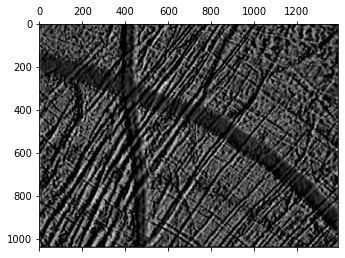

In [104]:
layer_name = ['conv2_block3_out', 'conv3_block3_out']
intermediate_layer_model = tf.keras.Model(inputs=model.input, outputs=model.get_layer(layer_name[0]).output)
intermediate_output = intermediate_layer_model.predict(x)

out_img = intermediate_output[0, :, :]

print("Saida do modelo:", out_img[:,:,13].shape)
print("Original:", original_size)
y = cv2.resize(out_img[:,:,1], original_size, cv2.INTER_LINEAR)
print("Apos resize:", y.shape)

plt.matshow(y, cmap='gray')

### Plot images to visualization

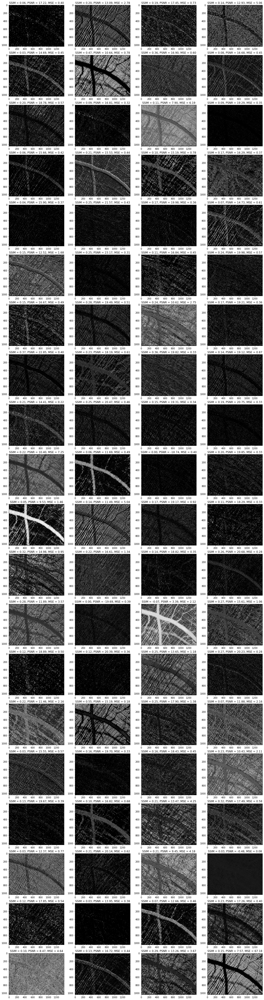

In [105]:
fig = plt.figure(figsize=(20, 80))
columns = 4
rows = 20

# ax enables access to manipulate each of subplots
ax = []

for i in range(columns*rows):
    x = img_as_float(cv2.cvtColor(img, cv2.COLOR_BGR2GRAY))
    y = img_as_float(cv2.resize(out_img[:,:,i], original_size, cv2.INTER_LINEAR))
    out_ssim = ssim(x, y, data_range=y.max() - y.min())
    out_psnr = psnr(x, y, data_range=y.max() - y.min())
    out_mse  = mse(x, y)
    
    # create subplot and append to ax
    ax.append( fig.add_subplot(rows, columns, i+1) )
    ax[-1].set_title("SSIM = {:.2f}, PSNR = {:.2f}, MSE = {:.2f}".format(out_ssim, out_psnr, out_mse))
    plt.imshow(y, cmap='gray')

plt.show()  # finally, render the plot

In [40]:
print(y.shape)
print(x.shape)
out_img.shape

(244, 360)
(244, 360)


(238, 350, 256)

In [24]:
out_img[:,:,1]

array([[0.62919134, 1.5652283 , 1.1834008 , ..., 1.107133  , 1.0403486 ,
        1.3050727 ],
       [0.5424422 , 1.4349244 , 1.153998  , ..., 0.9151438 , 0.79851305,
        1.7486043 ],
       [0.48658657, 1.3745556 , 1.2204515 , ..., 0.7792133 , 0.68189293,
        1.7357312 ],
       ...,
       [0.3774539 , 1.2140828 , 1.0706165 , ..., 1.2148637 , 0.8909795 ,
        1.7757183 ],
       [0.32592535, 1.3190075 , 1.0897655 , ..., 1.1206571 , 0.86514735,
        1.8701524 ],
       [0.39412463, 1.4125308 , 1.2420638 , ..., 1.2125126 , 1.083245  ,
        1.5742251 ]], dtype=float32)

In [65]:
M = None
img_as_row_0 = out_img[:,:,0].reshape(out_img.shape[0] * out_img.shape[1])
try:
    M = np.vstack((M, img_as_row_0))
except:
    M = img_as_row_0

img_as_row_1 = out_img[:,:,1].reshape(out_img.shape[0] * out_img.shape[1])
M = np.vstack((M, img_as_row_1))
M.shape

(2, 83300)

In [63]:
img_as_row_2 = out_img[:,:,2].reshape(out_img.shape[0] * out_img.shape[1])
M = np.vstack((M, img_as_row_2))
M.shape

(4, 83300)

In [56]:
M = cv2.normalize(M, 0, 1, norm_type=cv2.NORM_MINMAX)
M

array([[0.5825073 , 0.38841984, 0.49999806, ..., 0.2893535 , 0.21156867,
        0.02580772],
       [0.0953265 , 0.23714209, 0.17929277, ..., 0.1837034 , 0.16411853,
        0.23850514],
       [0.10563752, 0.07513949, 0.14617406, ..., 0.0942049 , 0.11760224,
        0.        ]], dtype=float32)

In [76]:
import pandas as pd

M = pd.DataFrame([])
for i in range(out_img.shape[2]):
    img = pd.Series(out_img[:,:,i].flatten(), name="Feature #"+str(i))
    img = (img - img.min()) / (img.max() - img.min())
    M = M.append(img)

M

,0,1,2,3,4,5,6,7,8,9,...,83290,83291,83292,83293,83294,83295,83296,83297,83298,83299
Feature #0,0.734605,0.489839,0.630552,0.491480,0.468295,0.477018,0.499520,0.600325,0.630512,0.638256,...,0.633038,0.528776,0.634597,0.709044,0.685645,0.695803,0.656422,0.364906,0.266811,0.032546
Feature #1,0.095326,0.237142,0.179293,0.169484,0.194120,0.214390,0.193410,0.182500,0.204415,0.227525,...,0.127327,0.144810,0.174139,0.184774,0.185638,0.186868,0.187215,0.183703,0.164119,0.238505
Feature #2,0.115581,0.082212,0.159933,0.129915,0.055214,0.067833,0.138420,0.115138,0.044213,0.076961,...,0.036969,0.025547,0.010278,0.045988,0.039450,0.033424,0.033989,0.103072,0.128672,0.000000
Feature #3,0.194186,0.278198,0.295291,0.272481,0.345006,0.333345,0.328559,0.319431,0.367595,0.345631,...,0.408428,0.418263,0.441937,0.466069,0.453061,0.449312,0.424422,0.331582,0.380316,0.290176
Feature #4,0.696506,0.628103,0.689887,0.780343,0.888757,0.847769,0.804503,0.835910,0.886495,0.857349,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Feature #251,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.013467,0.081063,0.019218,0.034865,0.000000,0.019042,0.000000,0.002557,0.000000,0.000000
Feature #252,0.175098,0.122826,0.181781,0.155467,0.101155,0.117660,0.159867,0.143994,0.106994,0.107757,...,0.234578,0.201857,0.176316,0.173181,0.176091,0.173212,0.176513,0.182664,0.162316,0.053313
Feature #253,1.000000,0.407681,0.384508,0.472236,0.475767,0.541821,0.487076,0.542845,0.589423,0.624929,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.010477
Feature #254,0.232931,0.237250,0.201110,0.194742,0.194683,0.182715,0.177797,0.188921,0.197437,0.202484,...,0.040419,0.035405,0.041381,0.024751,0.037052,0.045219,0.048583,0.058416,0.103646,0.215466


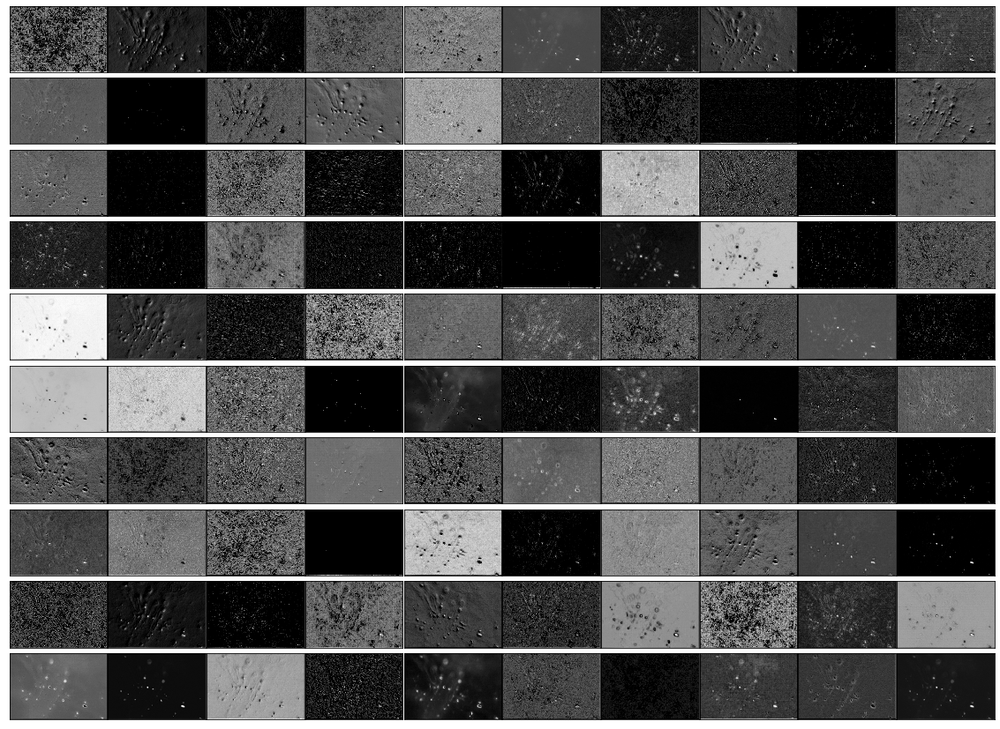

In [94]:
fig, axes = plt.subplots(10,10,figsize=(20,15),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.01, wspace=0.01))

for i, ax in enumerate(axes.flat):
    ax.imshow(M.iloc[i].values.reshape(238,350),cmap="gray")

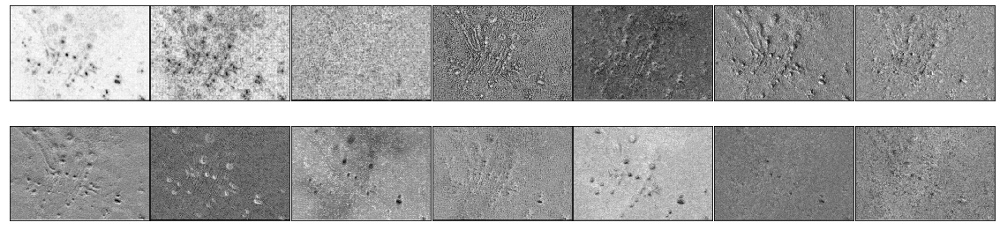

In [95]:
from sklearn.decomposition import PCA
data_pca = PCA(n_components=0.96)
data_pca.fit(M)

fig, axes = plt.subplots(2,7,figsize=(20,5),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.01, wspace=0.01))
for i, ax in enumerate(axes.flat):
    ax.imshow(data_pca.components_[i].reshape(238,350),cmap="gray")

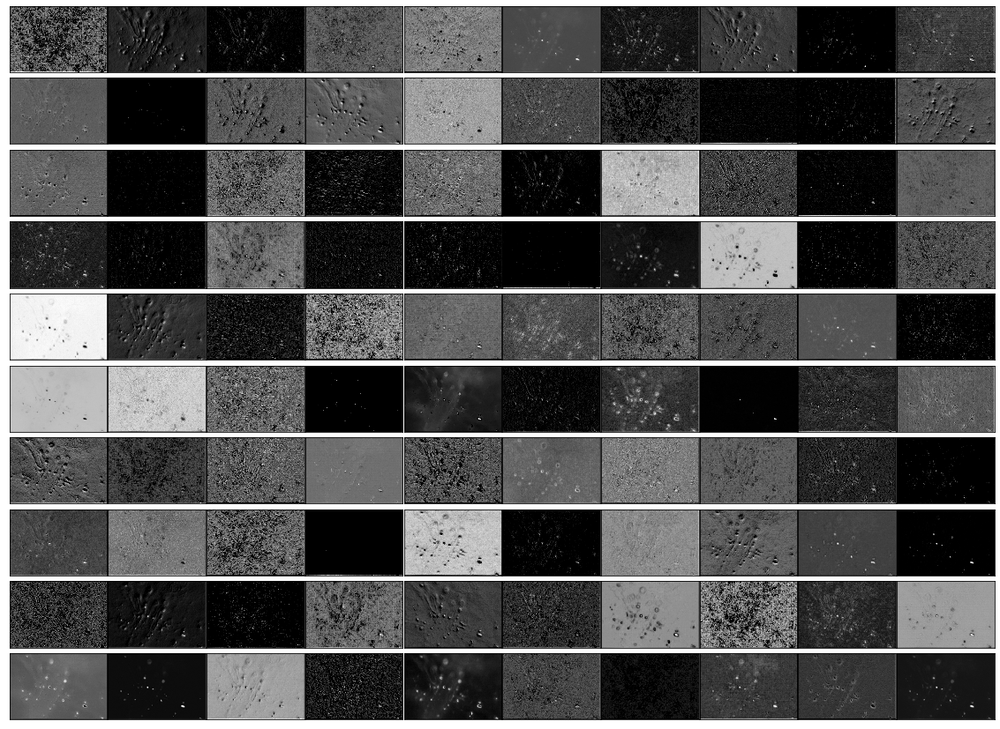

In [96]:
components = data_pca.transform(M)
projected = data_pca.inverse_transform(components)

fig, axes = plt.subplots(10,10,figsize=(20,15),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.01, wspace=0.01))

for i, ax in enumerate(axes.flat):
    ax.imshow(M.iloc[i].values.reshape(238,350),cmap="gray")